# Object Detection by using Tensorflow CNN

In [1]:
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import re
import json
import random
import tensorflow as tf

## Step1: load raw training, validation and testing data

In [2]:
train_rel = r'./Penguins_vs_Turtles/archive/train/train'
train_path = os.path.join(os.getcwd(), train_rel)
train_path_updir = os.path.join(os.getcwd(), r'./data/train')
valid_rel = r'./Penguins_vs_Turtles/archive/valid/valid'
valid_path = os.path.join(os.getcwd(), valid_rel)
valid_path_updir = os.path.join(os.getcwd(), r'./data/valid')

In [3]:
train_anno = open('./Penguins_vs_Turtles/archive/train_annotations', 'r')
valid_anno = open('./Penguins_vs_Turtles/archive/valid_annotations', 'r')
valid_anno = json.load(valid_anno)
train_anno = json.load(train_anno)

In [4]:
def draw_rectangle(image, bbox, colorBGR=(0,0,255)):
    new_image = image.copy()
    xmin = bbox[0]
    ymin = bbox[1]
    xmax = bbox[2] + xmin
    ymax = bbox[3] + ymin
    cv2.rectangle(new_image, (xmin, ymin), (xmax, ymax), colorBGR, 2)
    return new_image

In [5]:
trainfiles = os.listdir(train_path)
trainlabels = [(doc['category_id']-1) for doc in train_anno]
trainbounds = [doc['bbox'] for doc in train_anno]

In [6]:
random.seed(69420)
def augment(img, bbox):
    img = cv2.imread(img)
    img = img.copy()
    new_bbox = bbox.copy()
    x = random.randint(1, 100)

    if x % 3 == 0:
        img = cv2.flip(img, 0)
        #new_ymin = y - (ymin + height)
        new_bbox[1] = img.shape[0] - bbox[1] - bbox[3]
    elif x % 3 == 1:
        img = cv2.flip(img, 1)
        #new_xmin = x - (xmin + width)
        new_bbox[0] = img.shape[1] - bbox[0] - bbox[2]
    else:
        img = cv2.flip(img, 0)
        img = cv2.flip(img, 1)
        new_bbox[1] = img.shape[0] - bbox[1] - bbox[3]
        new_bbox[0] = img.shape[1] - bbox[0] - bbox[2]

    if x % 5 == 0:
        img = cv2.GaussianBlur(img, (5, 5), 0)
    padding_mask = np.all(img == [255, 255, 255], axis=-1)
    img[padding_mask] = [0,0,255]

    return img, new_bbox

In [7]:
def generate_hsv(img, bbox):
    img = cv2.imread(img)
    img = img.copy()
    padding_mask = np.all(img == [255, 255, 255], axis=-1)
    img[padding_mask] = [0,0,255]
    new_bbox = bbox.copy()
    hsv_image = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    kernel_size_mean = (3, 3)
    img = cv2.blur(hsv_image, kernel_size_mean)
    return img, new_bbox

In [8]:
def zoom(img, bbox):
    img = cv2.imread(img)
    new_bbox = bbox.copy()
    zoom_factor = 0.5

    new_size = int(640 * zoom_factor)
    padding = 640 - new_size
    top = left = padding // 2
    bottom = padding - top
    right = padding - left
    zoomed_img = cv2.resize(img, (new_size, new_size))
    img = cv2.copyMakeBorder(zoomed_img, top, bottom, left, right, cv2.BORDER_CONSTANT, value=[255, 255, 255])

    padding_mask = np.all(img == [255, 255, 255], axis=-1)
    img[padding_mask] = [0,0,255]

    #bound box
    new_bbox[0] = int(bbox[0] * zoom_factor) + left
    new_bbox[1] = int(bbox[1] * zoom_factor) + top
    new_bbox[2] = int(bbox[2] * zoom_factor)
    new_bbox[3] = int(bbox[3] * zoom_factor)

    return img, new_bbox

## Step 2: Preprocess images
Different augumentation techniques were used to generate more training image.

Techniques, such as Guassian blur, CLACHE, padding removal, contrast enhancement were used in preprocessing.

Finally, we got an imageset of 1200 original and augumented images for training.

In [9]:
def process_image(image):
    image = cv2.imread(image)
    #change padding colour
    padding_mask = np.all(image == [255, 255, 255], axis=-1)
    image[padding_mask] = [0,0,255]
    
    l_channel, a_channel, b_channel = cv2.split(cv2.cvtColor(image, cv2.COLOR_BGR2LAB))
    clahe = cv2.createCLAHE(clipLimit=10.0, tileGridSize=(5, 5))
    l_channel_clahe = clahe.apply(l_channel)
    merged = cv2.merge([l_channel_clahe, a_channel, b_channel])
    image = cv2.cvtColor(merged, cv2.COLOR_LAB2BGR)
    
    #change padding colour again
    image[padding_mask] = [0,0,255]
    return image

output_folder = "./processed_train"
os.makedirs(output_folder, exist_ok=True)

split_point = 400
processed_bounds = trainbounds[:split_point]
aug_bounds = []
#hsv_bounds = []
#zoom_bounds = []
processed_train_path = os.path.join(os.getcwd(), output_folder)
count = 0
for filename in trainfiles[:split_point]:
    image_path = os.path.join(train_path,filename)
    new_image = process_image(image_path)
    new_file = os.path.basename(re.sub(r'\d+', lambda x: x.group().zfill(4), filename))
    output_path = os.path.join(output_folder, new_file)
    cv2.imwrite(output_path, new_image)
    
    aug_image, aug_bbox = augment(image_path, processed_bounds[count])
    aug_file = os.path.basename('image_id_'+str(split_point+count).zfill(4)+'.jpg')
    output_path_aug = os.path.join(output_folder, aug_file)
    cv2.imwrite(output_path_aug, aug_image)
    aug_bounds.append(aug_bbox)
    
    #hsv_img, hsv_bbox = generate_hsv(image_path, processed_bounds[count])
    #hsv_file = os.path.basename('image_id_'+str(2*split_point+count).zfill(4)+'.jpg')
    #output_path_hsv = os.path.join(output_folder, hsv_file)
    #cv2.imwrite(output_path_hsv, hsv_img)
    #hsv_bounds.append(hsv_bbox)
    
    #zoom_img, zoom_bbox = zoom(image_path, processed_bounds[count])
    #zoom_file = os.path.basename('image_id_'+str(2*split_point+count).zfill(4)+'.jpg')
    #output_path_zoom = os.path.join(output_folder, zoom_file)
    #cv2.imwrite(output_path_zoom, zoom_img)
    #zoom_bounds.append(zoom_bbox)
    
    count += 1
    
del count
processed_bounds = processed_bounds + aug_bounds

In [10]:
def load_images_tf(path):
    tf_images = [tf.io.read_file(os.path.join(path, file)) for file in os.listdir(path)]
    return tf_images
train_raw = tf.data.Dataset.from_tensor_slices((load_images_tf(processed_train_path), processed_bounds))
test_raw = tf.data.Dataset.from_tensor_slices((load_images_tf(train_path)[split_point:], trainbounds[split_point:]))

In [11]:
def preprocess(image, bound):
    image = tf.image.decode_jpeg(image, channels=3)
    image = image/255
    return image, bound

In [12]:
batch_size = 16
train = train_raw.map(preprocess).batch(batch_size)
test = test_raw.map(preprocess).batch(batch_size)

## Step 3: Build and Train the model
The model consists of few types of layers:

Convolutional layers with different kernel sizes

Pooling layers (both maximum and average, minimum attempted but didn't work well)

Fully Connected layers

In [13]:
def build_model(inputs):
    x = tf.keras.layers.Conv2D(32, (5,5), activation='relu', input_shape=(640, 640, 3))(inputs)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.AveragePooling2D(4, 4)(x)
    
    x = tf.keras.layers.Conv2D(32, (3,3), activation='relu')(x)
    x = tf.keras.layers.AveragePooling2D(2, 2)(x)
    
    x = tf.keras.layers.Conv2D(64, (3,3), activation='relu')(x)  
    x = tf.keras.layers.MaxPooling2D(2, 2)(x)
    
    x = tf.keras.layers.Conv2D(64, (3,3), activation='relu')(x)   
    x = tf.keras.layers.Conv2D(64, (5,5), activation='relu')(x)
    x = tf.keras.layers.MaxPooling2D(2, 2)(x)
    
    x = tf.keras.layers.Conv2D(128, (3,3), activation='relu')(x)
    #x = tf.keras.layers.MaxPooling2D(2, 2)(x)
    
    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(256, activation='relu')(x)
    x = tf.keras.layers.Dense(64, activation='relu')(x)
    x = tf.keras.layers.Dense(4)(x)
    return x

inputs = tf.keras.Input(shape=(640, 640, 3))
model = tf.keras.Model(inputs=inputs, outputs=build_model(inputs))

The loss for validation became unstable after too much trainings, so the epoch is set to be 15 to avoid overfitting

In [14]:
model.compile(optimizer='adam', 
              loss='mse', 
              metrics=['mse'])

model.fit(train, validation_data=test, epochs=15)

Epoch 1/15
50/50 [==============================] - 135s 3s/step - loss: 24116.1504 - mse: 24116.1504 - val_loss: 50356.4102 - val_mse: 50356.4102
Epoch 2/15
50/50 [==============================] - 133s 3s/step - loss: 17485.5938 - mse: 17485.5938 - val_loss: 47359.4844 - val_mse: 47359.4844
Epoch 3/15
50/50 [==============================] - 133s 3s/step - loss: 16661.7070 - mse: 16661.7070 - val_loss: 45642.6211 - val_mse: 45642.6211
Epoch 4/15
50/50 [==============================] - 133s 3s/step - loss: 15291.8721 - mse: 15291.8721 - val_loss: 41798.9609 - val_mse: 41798.9609
Epoch 5/15
50/50 [==============================] - 134s 3s/step - loss: 14223.5664 - mse: 14223.5664 - val_loss: 36405.8164 - val_mse: 36405.8164
Epoch 6/15
50/50 [==============================] - 135s 3s/step - loss: 12830.9834 - mse: 12830.9834 - val_loss: 27670.8184 - val_mse: 27670.8184
Epoch 7/15
50/50 [==============================] - 133s 3s/step - loss: 12127.6084 - mse: 12127.6084 - val_loss: 2071

preprare test(validation) data and apply preprocessing


In [15]:
output_folder_valid = "./processed_valid"
os.makedirs(output_folder_valid, exist_ok=True)
for filename in os.listdir(valid_path):
    image_path = os.path.join(valid_path,filename)
    new_image = process_image(image_path)
    new_file = os.path.basename(filename)
    output_path_valid = os.path.join(output_folder_valid, new_file)
    cv2.imwrite(output_path_valid, new_image)

validlabels = [(doc['category_id']-1) for doc in valid_anno]
validbounds = [doc['bbox'] for doc in valid_anno]
valid_raw = tf.data.Dataset.from_tensor_slices((load_images_tf(output_folder_valid), validbounds))

loss, mse = model.evaluate(valid_raw.map(preprocess).batch(batch_size))

5/5 [==============================] - 2s 488ms/step - loss: 17533.6816 - mse: 17533.6816


Postprocessing

In [16]:
#the best model is saved, but the compeling parameters is lost accidientally.
model = tf.keras.models.load_model('./model4')
model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 640, 640, 3)]     0         
                                                                 
 conv2d_6 (Conv2D)           (None, 636, 636, 32)      2432      
                                                                 
 batch_normalization_1 (Bat  (None, 636, 636, 32)      128       
 chNormalization)                                                
                                                                 
 average_pooling2d_2 (Avera  (None, 159, 159, 32)      0         
 gePooling2D)                                                    
                                                                 
 conv2d_7 (Conv2D)           (None, 157, 157, 32)      9248      
                                                                 
 average_pooling2d_3 (Avera  (None, 78, 78, 32)        0   

In [17]:
bounds = model.predict(valid_raw.map(preprocess).batch(batch_size))
bounds_int = []
for bbox in bounds:
    new_bbox = []
    for element in bbox:
        new_bbox.append(int(element))
    new_bbox[0] = max(new_bbox[0],0)
    new_bbox[1] = max(new_bbox[1],0)
    new_bbox[2] = min(640 - new_bbox[0], new_bbox[2])
    new_bbox[3] = min(640 - new_bbox[1], new_bbox[3])
    bounds_int.append(new_bbox)

def bbox_remove_padding(img, bbox):
    img = img.copy()
    new_bbox = bbox.copy()
    xmin = bbox[0]
    ymin = bbox[1]
    xmax = bbox[2] + xmin
    ymax = bbox[3] + ymin

    # Check columns
    while np.all(img[ymin:ymax, xmin] == [255, 255, 255]) and xmin < xmax:
        xmin += 1
    while np.all(img[ymin:ymax, xmax-1] == [255, 255, 255]) and xmax > xmin:
        xmax -= 1
    #check rows
    while np.all(img[ymin, xmin:xmax] == [255, 255, 255]) and ymin < ymax:
        ymin += 1
    while np.all(img[ymax-1, xmin:xmax] == [255, 255, 255]) and ymax > ymin:
        ymax -= 1
    
    new_bbox[0] = xmin
    new_bbox[1] = ymin
    new_bbox[2] = xmax - xmin
    new_bbox[3] = ymax - ymin 
    return new_bbox

count = 0
for filename in os.listdir(valid_path):
    img = cv2.imread(os.path.join(valid_path, filename))
    bounds_int[count] = bbox_remove_padding(img,bounds_int[count])
    count += 1
    
del count

5/5 [==============================] - 3s 481ms/step


## Step 4: Evaluation
### Average Distance: 72.79
### Standard Deviation: 38.45 
### Average IoU: 0.48

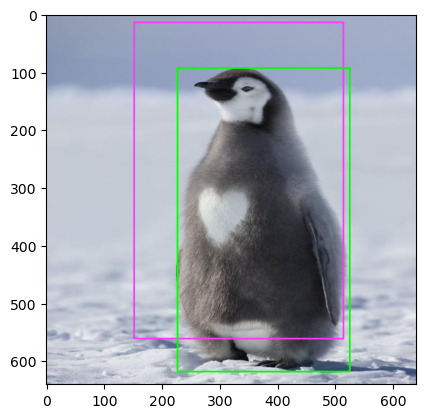

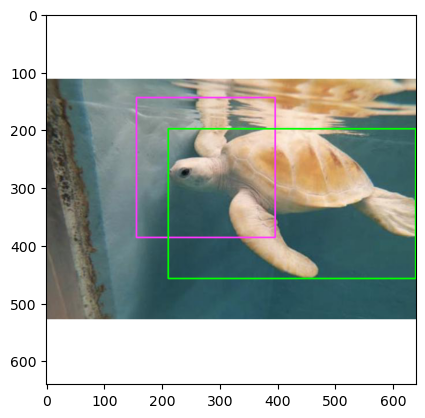

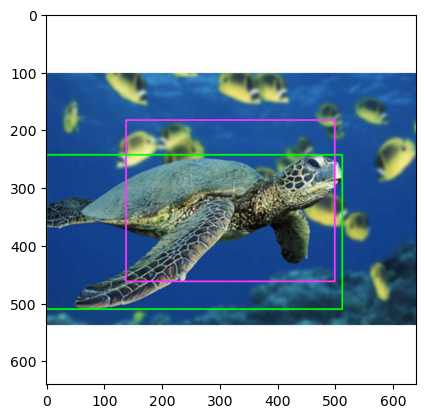

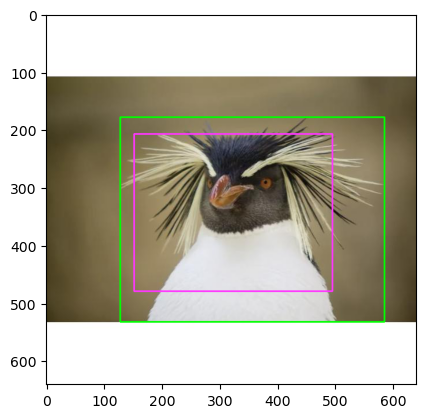

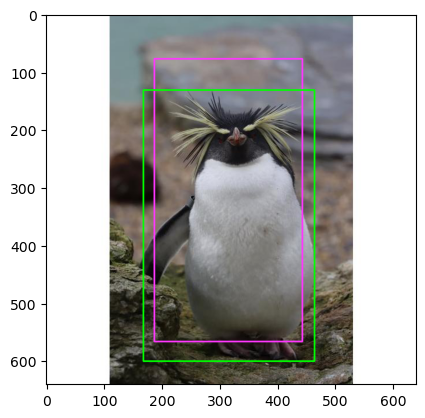

...

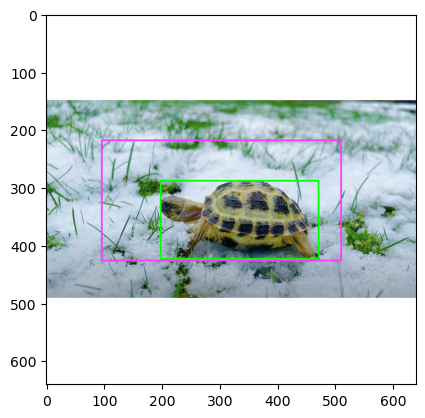

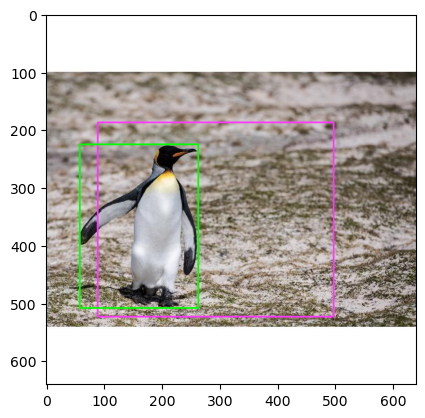

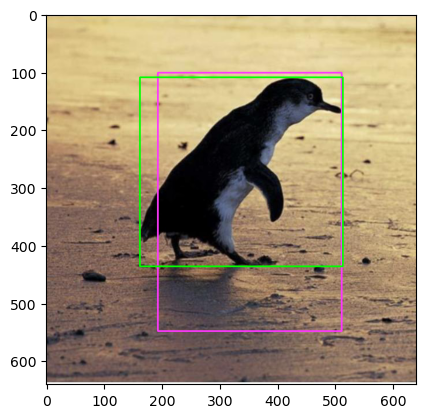

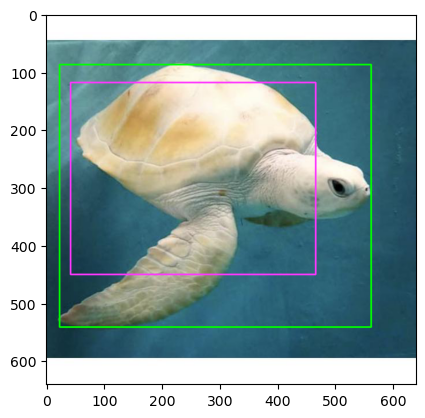

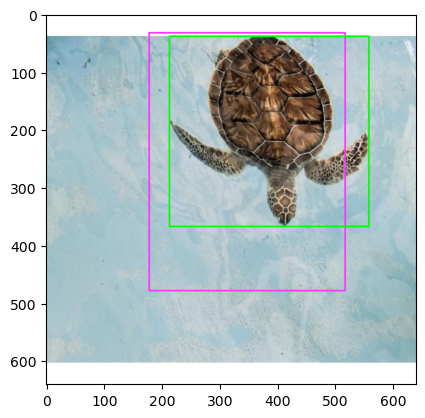

In [18]:
count = 0
for filename in os.listdir(valid_path):
    img = cv2.imread(os.path.join(valid_path, filename))
    bound = bounds_int[count]
    true_bound = valid_anno[count]['bbox'] 
    img = draw_rectangle(img, bound, colorBGR=(255, 55, 255))
    img = draw_rectangle(img, true_bound, colorBGR=(0,255,0))
    count += 1
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()
    
del count

In [19]:
def calculate_distance(pred_boxes, true_boxes):
    assert len(pred_boxes) == len(true_boxes)
    distances = []
    for pred_box, true_box in zip(pred_boxes, true_boxes):
        # True info
        true_x, true_y, true_w, true_h = true_box
        true_center_x = int(true_x + (true_w / 2))
        true_center_y = int(true_y + (true_h / 2))

        # Predicted info
        pred_x, pred_y, pred_w, pred_h = pred_box
        pred_center_x = int(pred_x + (pred_w / 2))
        pred_center_y = int(pred_y + (pred_h / 2))
        
        # Calculate the distance between centers
        center_distance = pow(pow(pred_center_x - true_center_x, 2) + pow(pred_center_y - true_center_y, 2), 0.5)
        print('Euclidean distance:',center_distance)
        distances.append(center_distance)
    
    distance_mean = np.mean(distances)
    distance_stdev = np.std(distances)
    print('Mean distance:', distance_mean )
    print('Standard Deviation:', distance_stdev)
    return distances, distance_mean, distance_stdev

calculate_distance(bounds_int, validbounds)

Euclidean distance: 80.45495634204272
Euclidean distance: 161.38463371709216
Euclidean distance: 82.21921916437786
Euclidean distance: 35.11409973215888
Euclidean distance: 44.01136216933077
Euclidean distance: 87.96590248499699
Euclidean distance: 66.85057965343307
Euclidean distance: 53.150729063673246
Euclidean distance: 82.92767933567175
Euclidean distance: 18.681541692269406
Euclidean distance: 69.85699678629192
Euclidean distance: 44.01136216933077
Euclidean distance: 122.37646832622684
Euclidean distance: 170.75128110793196
Euclidean distance: 67.06713054842886
Euclidean distance: 79.40403012442127
Euclidean distance: 79.22752047110903
Euclidean distance: 68.18357573492314
Euclidean distance: 155.3319027115808
Euclidean distance: 65.30696746902278
Euclidean distance: 25.45584412271571
Euclidean distance: 62.39390995922599
Euclidean distance: 104.23531071570709
Euclidean distance: 42.04759208325728
Euclidean distance: 89.05054744357274
Euclidean distance: 108.29589096544707
Eucli

([80.45495634204272,
  161.38463371709216,
  82.21921916437786,
  35.11409973215888,
  44.01136216933077,
  87.96590248499699,
  66.85057965343307,
  53.150729063673246,
  82.92767933567175,
  18.681541692269406,
  69.85699678629192,
  44.01136216933077,
  122.37646832622684,
  170.75128110793196,
  67.06713054842886,
  79.40403012442127,
  79.22752047110903,
  68.18357573492314,
  155.3319027115808,
  65.30696746902278,
  25.45584412271571,
  62.39390995922599,
  104.23531071570709,
  42.04759208325728,
  89.05054744357274,
  108.29589096544707,
  141.0283659410404,
  72.44998274671983,
  10.816653826391969,
  35.22782990761707,
  78.79086241436883,
  40.049968789001575,
  87.32124598286491,
  143.12232530251876,
  121.82364302548172,
  48.104053883222775,
  42.05948168962618,
  24.186773244895647,
  32.38826948140329,
  64.32728814430156,
  37.69615364994153,
  47.20169488482379,
  63.953107821277925,
  63.812224534175265,
  29.120439557122072,
  22.67156809750927,
  107.224064463160

In [20]:
def calculate_iou(pred_boxes, true_boxes):
    assert len(pred_boxes) == len(true_boxes)
    IOUs = []
    for pred_box, true_box in zip(pred_boxes, true_boxes):
        # True info
        true_x, true_y, true_w, true_h = true_box
        # Predicted info
        pred_x, pred_y, pred_w, pred_h = pred_box
        
        x1_intersection = max(true_x, pred_x)
        y1_intersection = max(true_y, pred_y)
        x2_intersection = min(pred_x + pred_w, true_x + true_w)
        y2_intersection = min(pred_y + pred_h, true_y + true_h)

        # Check if there is no intersection (negative width or height)
        if x1_intersection >= x2_intersection or y1_intersection >= y2_intersection:
            intersection = 0
        else:
            intersection = (x2_intersection - x1_intersection + 1)*(y2_intersection - y1_intersection + 1)
        pred_area = pred_w * pred_h
        true_area = true_w * true_h
        union = pred_area + true_area - intersection
        iou =intersection/union
        print('Union over Intersection:', iou)
        IOUs.append(iou)
    
    iou_ave = np.mean(IOUs)
    print('Average IOU:', iou_ave )
    return IOUs, iou_ave
calculate_iou(bounds_int, validbounds)

Union over Intersection: 0.6156651108518086
Union over Intersection: 0.2627786332580843
Union over Intersection: 0.5047438570695195
Union over Intersection: 0.5827180104491133
Union over Intersection: 0.7373976677459264
Union over Intersection: 0.641055032034653
Union over Intersection: 0.6527913712174174
Union over Intersection: 0.42664218736523035
Union over Intersection: 0.28359950308681336
Union over Intersection: 0.3072300765578739
Union over Intersection: 0.6546802086192698
Union over Intersection: 0.30072508744131027
Union over Intersection: 0.5382408298130411
Union over Intersection: 0.07063627835108438
Union over Intersection: 0.49716090075616987
Union over Intersection: 0.3697454717340354
Union over Intersection: 0.6388255869415443
Union over Intersection: 0.6818277502561152
Union over Intersection: 0.08683312866693955
Union over Intersection: 0.5494017077607599
Union over Intersection: 0.6897341383068615
Union over Intersection: 0.2910136850857284
Union over Intersection: 0.

([0.6156651108518086,
  0.2627786332580843,
  0.5047438570695195,
  0.5827180104491133,
  0.7373976677459264,
  0.641055032034653,
  0.6527913712174174,
  0.42664218736523035,
  0.28359950308681336,
  0.3072300765578739,
  0.6546802086192698,
  0.30072508744131027,
  0.5382408298130411,
  0.07063627835108438,
  0.49716090075616987,
  0.3697454717340354,
  0.6388255869415443,
  0.6818277502561152,
  0.08683312866693955,
  0.5494017077607599,
  0.6897341383068615,
  0.2910136850857284,
  0.4929502689341851,
  0.7068070876734442,
  0.39555956891305627,
  0.4775940303726249,
  0.4181103583803072,
  0.37769325699488154,
  0.1992895514565651,
  0.6628471322208418,
  0.6384151281724375,
  0.6014063498828042,
  0.5291211648465939,
  0.16271456027569753,
  0.14136703890047858,
  0.49183945524310496,
  0.7140040212830608,
  0.21143867324617185,
  0.3557984638072141,
  0.343505065212677,
  0.6643563519567238,
  0.6077975131344824,
  0.4781550203974207,
  0.6804218248509858,
  0.553731837035906,
 

## Step 5: Finalizing
clear the directory for temporary preprocessing and postprocessing images

export the result and stored as json file

export the trained model for future use

In [21]:
def clear_dir(dir):
    for file in os.listdir(dir):
        os.remove(os.path.join(dir, file))
clear_dir(output_folder)
clear_dir(output_folder_valid)

In [22]:
def store_json_bbox(bounds):
    bbox_dicts = []
    for i, bbox in enumerate(bounds):
        bbox_dict = {
            "id": i,
            "bbox": bbox
        }
        bbox_dicts.append(bbox_dict)
    return(bbox_dicts)

with open('result', 'w') as f:
    json.dump(store_json_bbox(bounds_int), f)